**00 -> Special pip install Libraries**

In [1]:
!pip install torchinfo

**01 -> Importing Standard Libraries**

In [2]:
import torch
from torch.utils.data import DataLoader
from torch import nn, optim
from torch.utils.tensorboard import SummaryWriter

import torchvision
from torchvision import datasets, transforms

import torchinfo
from torchinfo import summary

import numpy as np
import sys

from collections import OrderedDict

from matplotlib import pyplot as plt
from PIL import Image

**02 -> Define Custom Libraies**






02.0 -> Constants

In [3]:
imgMean = [0.49139968, 0.48215827 ,0.44653124]
imgStd = [0.24703233, 0.24348505, 0.26158768]

02.1 -> Common Utils

In [4]:
# Reverse the transformations to get back to a displayable image
def revertStandardizedImageTensor(img_tensor, imgMean, imgStd):

    # Reverse normalization
    for t, m, s in zip(img_tensor, imgMean, imgStd):
        t.mul_(s).add_(m)

    # Transpose channels (C, H, W) to (H, W, C)
    img_tensor = img_tensor.permute(1, 2, 0)

    # Convert to NumPy array and scale to 0-255
    img_numpy = img_tensor.detach().cpu().numpy()
    img_numpy = (img_numpy * 255).astype(np.uint8)

    # Convert to PIL Image
    pil_image = Image.fromarray(img_numpy)
    return pil_image

In [5]:
def plotImages_Dataset(dataset, class_label, nRows, nCols):
    n_classes  = len(class_label)
    cur_fig, cur_axes = plt.subplots(nRows, nCols)
    labelList = [item[1] for item in dataset]
    indList_UniqueClass = [labelList.index(i) for i in range(n_classes)]
    data = [dataset[idx] for idx in indList_UniqueClass]
    cur_axes = cur_axes.flatten()
    for cur_data, cur_ax in zip(data, cur_axes):
        img = cur_data[0]
        y = cur_data[1]
        # tensor data type has different data orientation
        # tensor:[channel, width, height] -> numpy_format: [width, height, channel]
        #img = img.permute(1, 2, 0)
        img = revertStandardizedImageTensor(img, imgMean, imgStd)
        cur_ax.imshow(img) # color image
        cur_ax.set_title(str(y) + ':' + class_label[y])
    cur_fig.suptitle('Sample Images for Each Labeled Classes')
    plt.show()

In [6]:
def printInfo_DataLoader(cur_DataLoader, data_category, sep_len=50):
    print("="*sep_len)
    print(f">>>  {data_category}  <<<")
    total_num_samples = cur_DataLoader.dataset.__len__()
    total_num_batches = cur_DataLoader.__len__()
    print(f"Total Number of Samples: {total_num_samples}")
    print(f"Total Number of Batches: {total_num_batches}")
    for X, y in cur_DataLoader:
        print(f"Shape of X [N, C, H, W]: {X.shape}")
        print(f"Shape of y: {y.shape} {y.dtype}")
        break
    print("-"*sep_len)

In [7]:
# For checkpoint
def checkpointStruct():
    # Note save model.state_dict() and optimizer.state_dict()
    checkpoint = {'model': [], 'optimizer': [], 'best_avg_loss': [], 'EpochSaved': [],
                  'fixed_noise': []}
    return checkpoint

class SaveCheckPoint:
    def __init__(self, savePath="my_checkpoint.pth.tar"):
        self.sepLen = 50
        self.savePath = savePath
        self.fileName = savePath.split(sep='\\')[-1]
        self.checkpoint = []

    def save_checkpoint(self, checkpoint):
        print('*' * self.sepLen)
        print(f"Save Checkpoint in {self.fileName}")
        print('*' * self.sepLen)
        torch.save(checkpoint, self.savePath)

    def load_checkpoint(self, model, optimizer, optSel):
        checkSel = os.path.exists(self.savePath)
        if checkSel == True:
            checkpoint = torch.load(self.savePath, weights_only=True)
            model.load_state_dict(checkpoint['model'])
            if optSel == 1:
                optimizer.load_state_dict(checkpoint['optimizer'])
            best_avg_loss = checkpoint['best_avg_loss']
            Epoch = checkpoint['EpochSaved']
            print('*' * self.sepLen)
            print(f"Load Checkpoint from {self.fileName}")
            print(f"Last Saved Loss from Epoch {Epoch} -> {best_avg_loss}")
            print('*' * self.sepLen)
            self.checkpoint = checkpoint
        else:
            print('*' * self.sepLen)
            print(f"Load Checkpoint is no available!")
            print('*' * self.sepLen)
            best_avg_loss = np.inf
            Epoch = -1

        return model, optimizer, best_avg_loss, Epoch

02.2 -> Define Customized Discriminator and Generator

In [8]:
# Discriminator
class CustomDiscriminator(nn.Module):
  def __init__(self, in_channels,
                 img_width, img_height):
    super(CustomDiscriminator, self).__init__()
    self.input_shapes_dict = {}
    self.in_channels = in_channels
    self.img_width =img_width
    self.img_height =img_height

    base_fea_channels = img_width

    self.conv1_block = nn.Sequential(
        nn.Conv2d(in_channels, base_fea_channels, kernel_size=4,
                  stride=2, padding=1, bias=False),
        nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

    self.conv2_block = nn.Sequential(
        nn.Conv2d(base_fea_channels, base_fea_channels * 2, kernel_size=4,
                  stride=2, padding=1, bias=False),
        nn.BatchNorm2d(base_fea_channels * 2),
        nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

    self.conv3_block = nn.Sequential(
        nn.Conv2d(base_fea_channels * 2, base_fea_channels * 4, kernel_size=4,
                  stride=2, padding=1, bias=False),
        nn.BatchNorm2d(base_fea_channels * 4),
        nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

    self.conv4_block = nn.Sequential(
        nn.Conv2d(base_fea_channels * 4, base_fea_channels * 8, kernel_size=4,
                  stride=2, padding=1, bias=False),
        nn.BatchNorm2d(base_fea_channels * 8),
        nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

    self.final_conv_block = nn.Sequential(
        nn.Conv2d(base_fea_channels * 8, 1, kernel_size=4,
                  stride=2, padding=1, bias=False),
        nn.Sigmoid()
        )
  def forward(self, x):
      self.input_shapes_dict['input2conv1'] = x.shape
      x = self.conv1_block(x)
      self.input_shapes_dict['input2conv2'] = x.shape
      x = self.conv2_block(x)
      self.input_shapes_dict['input2conv3'] = x.shape
      x = self.conv3_block(x)
      self.input_shapes_dict['input2conv4'] = x.shape
      x = self.conv4_block(x)
      self.input_shapes_dict['input2final'] = x.shape
      x = self.final_conv_block(x)
      self.input_shapes_dict['output'] = x.shape
      return x


In [9]:
# Generator
# z_dim -> noise vector
class CustomGenerator(nn.Module):
  def __init__(self, z_dim, out_channels,
                 img_width, img_height):
    super(CustomGenerator, self).__init__()
    self.input_shapes_dict = {}
    self.z_dim = z_dim
    self.out_channels = out_channels
    self.img_width = img_width
    self.img_height = img_height  # assuming both img_height and img_width the same

    base_fea_channels = img_width

    self.convT1_block = nn.Sequential(
        # input is z_dim, going into a convolution
        nn.ConvTranspose2d(z_dim, base_fea_channels * 8, kernel_size=4,
                           stride=1, padding=1, bias=False),
        nn.BatchNorm2d(base_fea_channels * 8),
        nn.ReLU(True)
        )

    self.convT2_block = nn.Sequential(
        nn.ConvTranspose2d(base_fea_channels * 8, base_fea_channels * 4, kernel_size=4,
                           stride=2, padding=1, bias=False),
        nn.BatchNorm2d(base_fea_channels * 4),
        nn.ReLU(True)
        )

    self.convT3_block = nn.Sequential(
        nn.ConvTranspose2d(base_fea_channels * 4, base_fea_channels * 2, kernel_size=4,
                           stride=2, padding=1, bias=False),
        nn.BatchNorm2d(base_fea_channels * 2),
        nn.ReLU(True)
        )

    self.convT4_block = nn.Sequential(
        nn.ConvTranspose2d(base_fea_channels * 2, base_fea_channels, kernel_size=4,
                           stride=2, padding=1, bias=False),
        nn.BatchNorm2d(base_fea_channels),
        nn.ReLU(True)
        )

    # use this for cifar10 images
    self.final_convT_block = nn.Sequential(
        nn.ConvTranspose2d(base_fea_channels, out_channels, kernel_size=4,
                           stride=2, padding= 1, bias=False),
        nn.Tanh()
        )

  def forward(self,x):
    # initial expected size: [batch_size, z_dims, 1, 1] -> [32, 128, 1, 1]
    self.input_shapes_dict['input2convT1'] = x.shape
    x = self.convT1_block(x)
    self.input_shapes_dict['input2convT2'] = x.shape
    x = self.convT2_block(x)
    self.input_shapes_dict['input2convT3'] = x.shape
    x = self.convT3_block(x)
    self.input_shapes_dict['input2convT4'] = x.shape
    x = self.convT4_block(x)
    self.input_shapes_dict['input2final'] = x.shape
    x = self.final_convT_block(x)
    self.input_shapes_dict['output'] = x.shape
    return x

02.3 -> Model Trainig Utils

In [10]:
def generate_latent_points(n_samples, z_dim):
    rand_noise = np.random.randn(n_samples, z_dim, 1, 1)
    return rand_noise


In [11]:
#Training (Note: Model need not to be return, all weights are updated within)
# z_dim is noise vector dimension for the generator
#----------------------------------------------------------------------
def train_model(train_dataloader, model_disc, model_gen,criterion,
                opt_disc, opt_gen,z_dim, total_epochs, fixed_noise, use_fixed_noise,
                writer_fake, writer_real, device, ith_epoch):
    totalNumOfBatches = len(train_dataloader)
    totalNumOfSamples = len(train_dataloader.dataset)
    zeroPadWidth = int(np.ceil(np.log10(totalNumOfBatches)))

    # The .data member is still ndarray, you can only get tensor type
    # when using next(iter(...))
    curBatchImgs, curBatchLabels = next(iter(train_dataloader))
    imgDims = curBatchImgs[0].shape

    img_flatten_dim = 1
    for item in list(imgDims):
        img_flatten_dim *= item

    # for tensors [channel, row, col]
    channel_size_img = imgDims[0]
    row_size_img = imgDims[1]
    col_size_img = imgDims[2]

    total_lossD = 0.0
    total_lossG = 0.0

    step = ith_epoch
    # Enable weight updates
    model_disc.train()
    model_gen.train()

    for batch_idx, (real, realLab) in enumerate(train_dataloader):
        # train discriminator: Objective min_G max_D (log(D(real)) + log(1-D(G(z))))
        # BCE loss is similar in min -1*(log(D(real)) for real loss
        # Real Part
        real = real.to(device)
        batch_size = real.shape[0]

        # Fake Part
        # BCE loss is similar in min -1*(log(1-D(G(z)))) for fake loss
        noise = torch.randn(batch_size, z_dim, 1, 1).to(device)
        fake = model_gen(noise)

        # Predict and Loss of Real Part
        disc_real = model_disc(real).view(-1)
        lossD_real = criterion(disc_real, torch.ones_like(disc_real))

        # Predict and loss of Fake part (fake.detach ensure
        # it does NOT affect discriminator weight updates
        disc_fake = model_disc(fake.detach()).view(-1)
        lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))

        # Combine both real and fake losses
        lossD = (lossD_real + lossD_fake) / 2.0

        # Real Part Loss and weight update
        model_disc.zero_grad()
        lossD.backward()
        opt_disc.step()

        # Fake part Loss and weight update
        # Train Generator objective min log(1-D(G(z))) <-> similar max log(D(G(z))
        # similar as min -1*(log(D(G(z)))
        output = model_disc(fake).view(-1)
        lossG = criterion(output, torch.ones_like(output))
        model_gen.zero_grad()
        lossG.backward()
        opt_gen.step()

        if batch_idx == 0: # save the results for the first batch of everh epoch
            print(
                f"Epoch [{ith_epoch+1}/{total_epochs}] "
                f"Batch [{batch_idx}/{totalNumOfBatches}]"
                f"Loss D:{lossD:.4f}, Loss G: {lossG:.4f}"
            )
            eval_noise = noise
            if use_fixed_noise == True:
                eval_noise = fixed_noise

            model_gen.eval()
            with (((torch.no_grad()))):
                fake = model_gen(eval_noise)
                fake = fake.reshape(-1, channel_size_img, row_size_img, col_size_img)
                data = real.reshape(-1, channel_size_img, row_size_img, col_size_img)
                img_grid_fake = torchvision.utils.make_grid(fake, normalize=True)
                img_grid_real = torchvision.utils.make_grid(data, normalize=True)
                writer_fake.add_image(
                    f"CIFAR10 fake Imags", img_grid_fake, global_step=step
                )
                writer_real.add_image(
                    f"CIFAR10 real Imags", img_grid_real, global_step=step
                )
            model_gen.train()
        elif batch_idx % 100 == 0 or batch_idx == totalNumOfBatches-1:
            print(
                f"Epoch [{ith_epoch+1}/{total_epochs}] "
                f"Batch [{batch_idx}/{totalNumOfBatches}]"
                f"Loss D:{lossD:.4f}, Loss G: {lossG:.4f}"
            )

        total_lossD += lossD.item()
        total_lossG += lossG.item()
    epoch_avg_lossD = total_lossD / totalNumOfBatches
    epoch_avg_lossG = total_lossG / totalNumOfBatches
    return epoch_avg_lossD, epoch_avg_lossG

In [12]:
sep = 50
def train_model_under_n_epochs(train_dataloader, model_disc, model_gen,
                               criterion, opt_disc, opt_gen,
                               z_dim, total_epochs, fixed_noise, use_fixed_noise,
                               writer_fake, writer_real, device):

    for ith_epoch in range(total_epochs):
        epoch_avg_lossD, epoch_avg_lossG = train_model(train_dataloader, model_disc, model_gen,criterion,
                                                       opt_disc, opt_gen,z_dim, total_epochs, fixed_noise, use_fixed_noise,
                                                       writer_fake, writer_real,device, ith_epoch)

        total_loss = epoch_avg_lossD + epoch_avg_lossG
        checkpt_disc = checkpointStruct()
        saved_model_disc = SaveCheckPoint(f"optimal_GAN_Disc_CIFAR10_state_dict.pt")
        checkpt_disc['model'] = model_disc.state_dict()
        checkpt_disc['optimizer'] = opt_disc.state_dict()
        checkpt_disc['best_avg_loss'] = epoch_avg_lossD
        checkpt_disc['EpochSaved'] = ith_epoch
        checkpt_disc['fixed_noise'] = fixed_noise
        saved_model_disc.save_checkpoint(checkpt_disc)
        print(f"Discriminator save @ Epoch {ith_epoch} with current loss {epoch_avg_lossD} saved!")

        checkpt_gen = checkpointStruct()
        saved_model_gen = SaveCheckPoint(f"optimal_GAN_Gen_CIFAR10_state_dict.pt")
        checkpt_gen['model'] = model_gen.state_dict()
        checkpt_gen['optimizer'] = opt_gen.state_dict()
        checkpt_gen['best_avg_loss'] = epoch_avg_lossG
        checkpt_gen['EpochSaved'] = ith_epoch
        checkpt_gen['fixed_noise'] = fixed_noise
        saved_model_gen.save_checkpoint(checkpt_gen)
        print(f"Generator save @ Epoch {ith_epoch} with current loss {epoch_avg_lossG} saved!")
        print(f"total loss: {total_loss}")



**03 -> Check available accerlerator and package versions**

In [13]:
device = torch.accelerator.current_accelerator().type if torch.accelerator.is_available() else 'cpu'
print(f"* Current Available Accelerator Device: {device}")
print(f"* torch version: {torch.__version__}")
print(f"* torchvision version: {torchvision.__version__}")
print(f"* python version: {sys.version}")
print(f"* torchinfo version: {torchinfo.__version__}")

* Current Available Accelerator Device: cuda
* torch version: 2.8.0+cu126
* torchvision version: 0.23.0+cu126
* python version: 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
* torchinfo version: 1.8.0


**04 -> Preparing your training data and validation data**

In [14]:
normalize = transforms.Normalize(
        mean=imgMean,
        std=imgStd,
    )
transform = transforms.Compose([
    transforms.ToTensor(),           # Convert to tensor
    normalize
])

In [15]:
training_data = datasets.CIFAR10(root="online_data/CIFAR10",
                                      train=True,
                                      download=True,
                                      transform=transform
                                      )

100%|██████████| 170M/170M [00:13<00:00, 12.4MB/s]


In [16]:
valid_data = datasets.CIFAR10(root="online_data/CIFAR10",
                                   train=False,
                                   download=True,
                                   transform=transform
                                   )

**05 -> Information about the dataset**

In [17]:
classLabel= {0:'airplane', 1:'automobile', 2:'bird', 3:'cat',4:'deer', 5:'dog',
             6:'frog', 7:'horse', 8:'ship', 9:'truck'}
print(f"* Image shape [width, height, channel]: {valid_data.data[0].shape}")
print(f"* Image data-type: {type(valid_data.data[0])}")
print(f"* Training data size: {training_data.data.shape}")
print(f"* Validation data size: {valid_data.data.shape}")

* Image shape [width, height, channel]: (32, 32, 3)
* Image data-type: <class 'numpy.ndarray'>
* Training data size: (50000, 32, 32, 3)
* Validation data size: (10000, 32, 32, 3)


**06 -> View Sample Images**

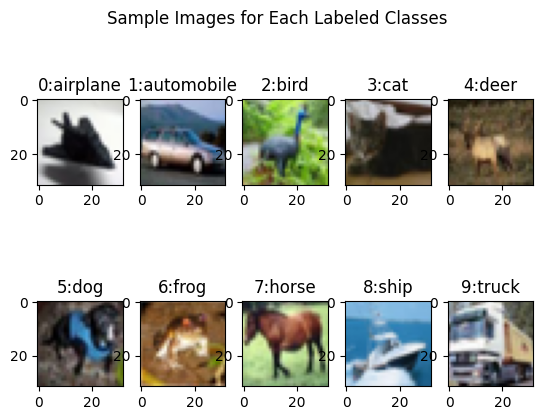

In [18]:
plotImages_Dataset(training_data, classLabel, nRows=2, nCols=5)

**07 -> Hyperparameters**

In [19]:
img_width = 32
img_height = 32
in_channels = 3
out_channels = 3
# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5
# Learning rate for optimizers
learning_rate_disc = 2e-4
learning_rate_gen  = 2e-4
z_dim = 128
batch_size = 32
total_epochs = 25
use_fixed_noise = True
writer_fake = SummaryWriter(f"runs/GAN_CIFAR10/fake")
writer_real = SummaryWriter(f"runs/GAN_CIFAR10/real")


**08 -> Prepare dataloader and print some basic info on each dataset**

In [20]:
train_dataloader = DataLoader(training_data, batch_size=batch_size)
valid_dataloader = DataLoader(valid_data, batch_size=batch_size)

printInfo_DataLoader(train_dataloader, 'Training DataSet')
printInfo_DataLoader(valid_dataloader, 'Validating DataSet')

>>>  Training DataSet  <<<
Total Number of Samples: 50000
Total Number of Batches: 1563
Shape of X [N, C, H, W]: torch.Size([32, 3, 32, 32])
Shape of y: torch.Size([32]) torch.int64
--------------------------------------------------
>>>  Validating DataSet  <<<
Total Number of Samples: 10000
Total Number of Batches: 313
Shape of X [N, C, H, W]: torch.Size([32, 3, 32, 32])
Shape of y: torch.Size([32]) torch.int64
--------------------------------------------------


**09 -> Setup Model and View Basic Layer Info**

In [21]:
fake_img = torch.randn((batch_size, img_width, img_height, 3))
fixed_noise = torch.randn((batch_size, z_dim,1, 1))

In [22]:
model_disc = CustomDiscriminator(in_channels, img_width,
                                 img_height).to(device)
summary(model_disc, (batch_size, in_channels, img_width, img_height))


Layer (type:depth-idx)                   Output Shape              Param #
CustomDiscriminator                      [32, 1, 1, 1]             --
├─Sequential: 1-1                        [32, 32, 16, 16]          --
│    └─Conv2d: 2-1                       [32, 32, 16, 16]          1,536
│    └─LeakyReLU: 2-2                    [32, 32, 16, 16]          --
├─Sequential: 1-2                        [32, 64, 8, 8]            --
│    └─Conv2d: 2-3                       [32, 64, 8, 8]            32,768
│    └─BatchNorm2d: 2-4                  [32, 64, 8, 8]            128
│    └─LeakyReLU: 2-5                    [32, 64, 8, 8]            --
├─Sequential: 1-3                        [32, 128, 4, 4]           --
│    └─Conv2d: 2-6                       [32, 128, 4, 4]           131,072
│    └─BatchNorm2d: 2-7                  [32, 128, 4, 4]           256
│    └─LeakyReLU: 2-8                    [32, 128, 4, 4]           --
├─Sequential: 1-4                        [32, 256, 2, 2]           --
│

In [23]:
model_gen = CustomGenerator(z_dim, out_channels,
                            img_width, img_height).to(device)
summary(model_gen, (batch_size,z_dim,1,1))

Layer (type:depth-idx)                   Output Shape              Param #
CustomGenerator                          [32, 3, 32, 32]           --
├─Sequential: 1-1                        [32, 256, 2, 2]           --
│    └─ConvTranspose2d: 2-1              [32, 256, 2, 2]           524,288
│    └─BatchNorm2d: 2-2                  [32, 256, 2, 2]           512
│    └─ReLU: 2-3                         [32, 256, 2, 2]           --
├─Sequential: 1-2                        [32, 128, 4, 4]           --
│    └─ConvTranspose2d: 2-4              [32, 128, 4, 4]           524,288
│    └─BatchNorm2d: 2-5                  [32, 128, 4, 4]           256
│    └─ReLU: 2-6                         [32, 128, 4, 4]           --
├─Sequential: 1-3                        [32, 64, 8, 8]            --
│    └─ConvTranspose2d: 2-7              [32, 64, 8, 8]            131,072
│    └─BatchNorm2d: 2-8                  [32, 64, 8, 8]            128
│    └─ReLU: 2-9                         [32, 64, 8, 8]            

**10 -> Loss function and optimizer setup**

In [24]:
criterion = nn.BCELoss()
opt_disc = torch.optim.Adam(model_disc.parameters(),
                            lr=learning_rate_disc, betas=(beta1, 0.999))
opt_gen = torch.optim.Adam(model_gen.parameters(),
                           lr=learning_rate_gen, betas=(beta1, 0.999))


**11 -> Train model under n epochs**

In [25]:
# Use fixed_noise if you want to see the progressive changes
fixed_noise = torch.randn((batch_size, z_dim, 1, 1)).to(device)

train_model_under_n_epochs(train_dataloader, model_disc, model_gen, criterion,
                           opt_disc, opt_gen,z_dim, total_epochs, fixed_noise, use_fixed_noise,
                           writer_fake, writer_real, device)

Epoch [1/25] Batch [0/1563]Loss D:0.7291, Loss G: 1.0593
Epoch [1/25] Batch [100/1563]Loss D:0.0343, Loss G: 5.1096
Epoch [1/25] Batch [200/1563]Loss D:0.2195, Loss G: 3.0371
Epoch [1/25] Batch [300/1563]Loss D:0.1501, Loss G: 3.5795
Epoch [1/25] Batch [400/1563]Loss D:0.1612, Loss G: 3.8869
Epoch [1/25] Batch [500/1563]Loss D:0.1279, Loss G: 3.8580
Epoch [1/25] Batch [600/1563]Loss D:0.1503, Loss G: 3.0680
Epoch [1/25] Batch [700/1563]Loss D:0.2185, Loss G: 4.0750
Epoch [1/25] Batch [800/1563]Loss D:0.2507, Loss G: 1.8985
Epoch [1/25] Batch [900/1563]Loss D:0.2741, Loss G: 4.2038
Epoch [1/25] Batch [1000/1563]Loss D:0.2154, Loss G: 4.8202
Epoch [1/25] Batch [1100/1563]Loss D:0.2315, Loss G: 4.9229
Epoch [1/25] Batch [1200/1563]Loss D:0.2148, Loss G: 3.9348
Epoch [1/25] Batch [1300/1563]Loss D:0.2630, Loss G: 4.0050
Epoch [1/25] Batch [1400/1563]Loss D:0.1703, Loss G: 3.1785
Epoch [1/25] Batch [1500/1563]Loss D:0.2002, Loss G: 3.9394
Epoch [1/25] Batch [1562/1563]Loss D:0.0745, Loss G:

**12 -> View Results with TensorBoard**

In [26]:
%load_ext tensorboard
%tensorboard --logdir ./runs/GAN_CIFAR10/

<IPython.core.display.Javascript object>

**References:**


1.   https://eliottbrion.github.io/2018-06-13/understanding-the-GAN-value-function
2.   https://www.youtube.com/watch?v=OljTVUVzPpM&list=PLhhyoLH6IjfxeoooqP9rhU3HJIAVAJ3Vz&index=24&t=1254s
3.   https://stackoverflow.com/questions/42690721/how-to-interpret-the-discriminators-loss-and-the-generators-loss-in-generative
4.   https://docs.pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html
5.   https://docs.pytorch.org/docs/stable/generated/torch.nn.ConvTranspose2d.html
6.   https://www.geeksforgeeks.org/deep-learning/generative-adversarial-network-gan/










